In [2]:
pip install SuperSuit==3.6.0 pettingzoo==1.22.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.2/68.2 kB 1.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.4/823.4 kB 17.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 979.5/979.5 kB 48.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 495.5/495.5 kB 44.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.7/721.7 kB 43.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.9/21.9 MB 52.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.1/879.1 kB 75.4 MB/s eta 0:00:00
  Created wheel for gym: filename=gym-0.26.2-py3-none-any.whl size=827632 sha256=80f464526b74af20fc7ef349806b1eb7935b6455eaed6285d3877785f834883c
  Stored in directory: /root/.cache/pip/wheels/af/2b/30/5e78b8b9599f2a2286a582b8da80594f654bf0e18d825a4405
Successfully built

# 相手が変わるーgrowing chain length + Boot DQN

In [32]:
import numpy as np
import math
import random
from collections import namedtuple, deque
from itertools import count
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions.categorical import Categorical
import datetime


from supersuit import color_reduction_v0, frame_stack_v1, resize_v1


from ipd_v7 import ipd
from IPD_utils import batchify_obs, batchify, unbatchify, save_buffer, plot_buffer, save_loss, pop, save_action,plot
from AgentMaster import HeadNet, BootDQN, DQN, Agent_1, Agent_2
from BootDQN import args, ReplayMemory, TRAINER, plot_durations, Transition




## SNS

In [50]:
r_15 = pd.read_csv('v7_r_15.csv')

In [101]:
r_15['episodic_return']

0      49.854041
1      57.180324
2      42.881695
3      41.154428
4      37.105654
         ...    
995    49.179711
996    23.573931
997    22.600856
998    20.845380
999    26.603580
Name: episodic_return, Length: 1000, dtype: float64

In [108]:
r_15['episodic_return'].rolling(20).mean()

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
         ...    
995    27.606421
996    26.670368
997    26.929784
998    25.891677
999    26.070157
Name: episodic_return, Length: 1000, dtype: float64

In [54]:
index_list = list(r_15.index)

In [71]:
# data = {
# 'index':index_list,
# 'seed_8':pd.read_csv('v7_r_15.csv')['episodic_return'],
# 'seed_7':pd.read_csv('v7_r_14.csv')['episodic_return'],
# 'seed_6':pd.read_csv('v7_r_13.csv')['episodic_return'],
# 'seed_5':pd.read_csv('v7_r_12.csv')['episodic_return'],
# 'seed_4':pd.read_csv('v7_r_10.csv')['episodic_return'],
# }

In [91]:
data = {
'index':index_list+index_list+index_list+index_list+index_list,
'seed_8_7_6_5_4':list(pd.read_csv('v7_r_15.csv')['episodic_return'])+
    list(pd.read_csv('v7_r_14.csv')['episodic_return'])+
    list(pd.read_csv('v7_r_13.csv')['episodic_return'])+
    list(pd.read_csv('v7_r_12.csv')['episodic_return'])+
    list(pd.read_csv('v7_r_10.csv')['episodic_return']),

}

In [92]:
fmri = pd.DataFrame.from_dict(data)

In [93]:
fmri

,index,seed_8_7_6_5_4
0,0,49.854041
1,1,57.180324
2,2,42.881695
3,3,41.154428
4,4,37.105654
...,...,...
4995,995,34.033517
4996,996,44.201074
4997,997,39.153435
4998,998,47.723980


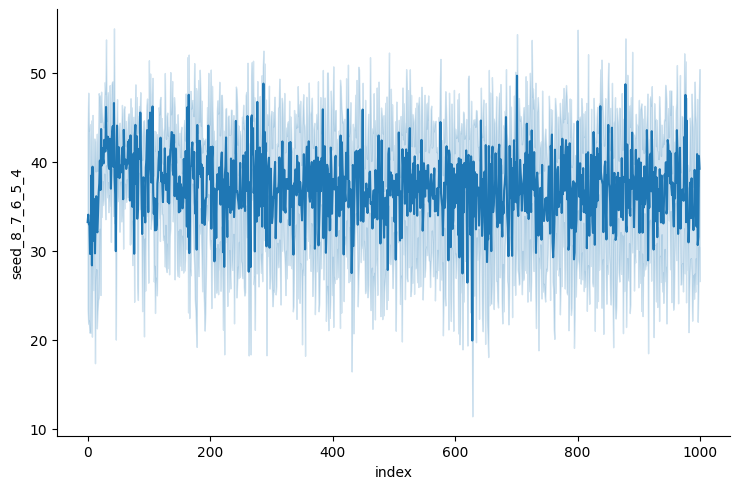

In [97]:
sns.relplot(data=fmri, x='index',y='seed_8_7_6_5_4',kind='line',aspect=2.0)

## seed=8, max_cycles=16, num_episodes = 1000

In [20]:
args.num_episodes = 1000
args.seed = 8
args.max_cycles = 16
torch.manual_seed(args.seed)

In [21]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

agents:  ['player_0', 'player_1']
>>> episode : 0
{(0, 0): (3.1158775328811465, 3.1158775328811465), (0, 1): (0.029361305791302195, 4.941821910600118), (1, 0): (4.572137924817887, 0.35869079062257075), (1, 1): (1.5345062224119461, 1.5345062224119461)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (3.840527961782511, 3.840527961782511), (0, 1): (-0.42759578854435826, 4.972136481124103), (1, 0): (4.988879214182837, -0.005576445998991193), (1, 1): (1.0595903877307875, 1.0595903877307875)}
Data Buffering Complete
>>> episode : 2
{(0, 0): (3.437998666753879, 3.437998666753879), (0, 1): (0.40642776636954125, 4.920645384901943), (1, 0): (5.297100739801752, 0.06419741434007309), (1, 1): (1.2901793388417504, 1.2901793388417504)}
Data Buffering Complete
>>> episode : 3
{(0, 0): (2.9702685287455175, 2.9702685287455175), (0, 1): (-0.2146657677476016, 5.313036326698991), (1, 0): (5.057985633466036, 0.022756707691968043), (1, 1): (0.5122631019725182, 0.5122631019725182)}
Data Buffering Complete
>

/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 8
{(0, 0): (3.12447596320768, 3.12447596320768), (0, 1): (-0.4484523273162686, 4.961216156922192), (1, 0): (5.099484217295408, 0.04009919541912805), (1, 1): (1.5509823022331162, 1.5509823022331162)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 9
{(0, 0): (3.0557905739720392, 3.0557905739720392), (0, 1): (-0.24446772977531123, 5.232497672349741), (1, 0): (5.367040312675428, 0.2113532209815365), (1, 1): (1.0201138271750723, 1.0201138271750723)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 10
{(0, 0): (3.1589495227241406, 3.1589495227241406), (0, 1): (-0.16990954361912672, 4.894443180022383), (1, 0): (4.924199823696656, -0.14183356580525225), (1, 1): (0.993944118997024, 0.993944118997024)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 11
{(0, 0): (3.041307380558722, 3.041307380558722), (0, 1): (0.03728763997547931, 5.062913350317468), (1, 0): (5.054030747535544, 0.15050743809760864), (1, 1): (1

In [22]:
return_dir = 'v7_r_15.csv'
action_dir = 'v7_a_15.csv'
return_x_dir = 'v7_rx_15.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
15995,1,1
15996,1,1
15997,1,1
15998,1,1


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


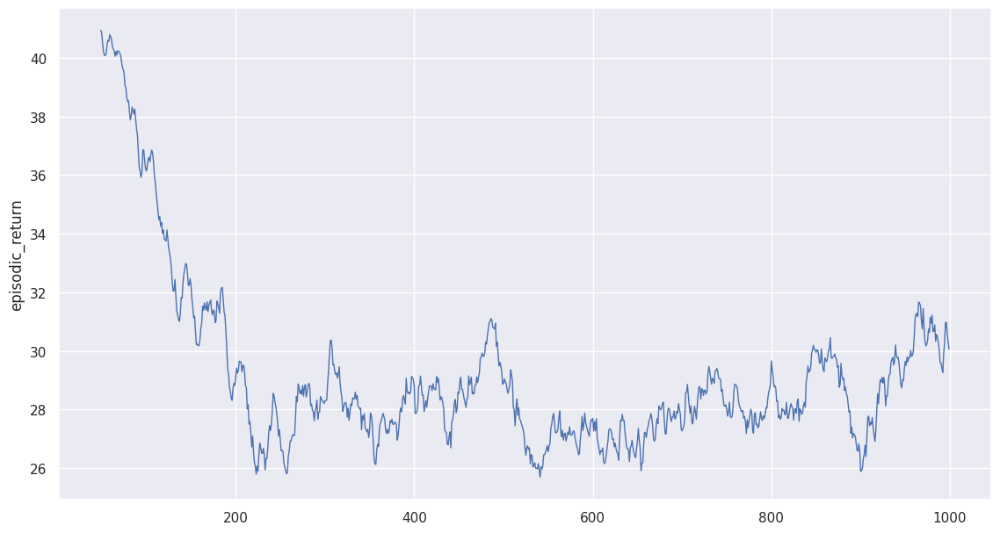

In [23]:
plot(return_dir)

In [25]:
pd.read_csv(return_dir).describe()

,episodic_return
count,1000.000000
mean,29.455792
std,10.641235
min,6.152971
25%,21.032560
50%,27.402824
75%,37.314688
max,61.965151


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


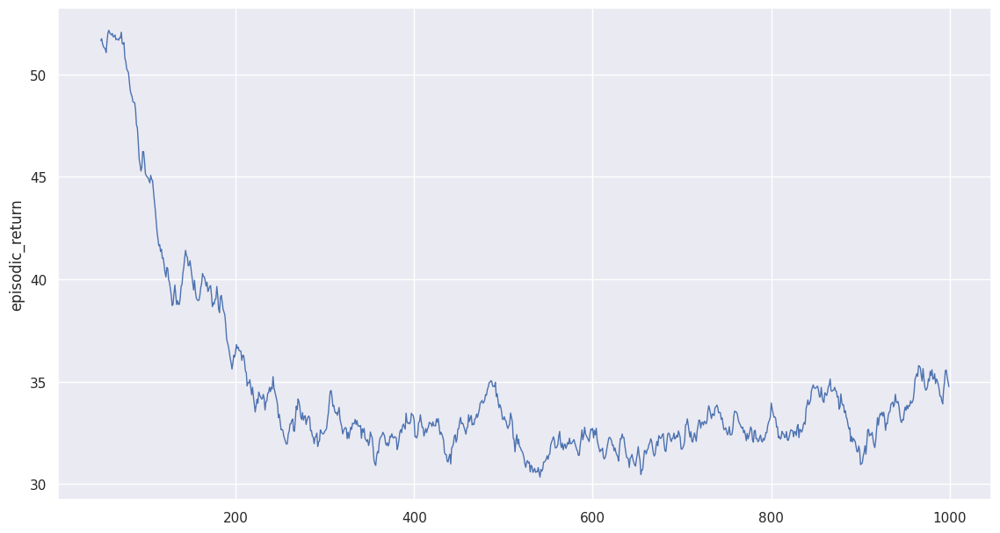

In [26]:
plot(return_x_dir)

In [27]:
pd.read_csv(return_x_dir).describe()

,episodic_return
count,1000.000000
mean,34.924372
std,10.874835
min,12.677494
25%,26.160520
50%,32.735610
75%,43.333971
max,65.514666


In [24]:
actions = pd.read_csv(action_dir)
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    8077
1    7923
Name: player 0, dtype: int64
1    9013
0    6987
Name: player 1, dtype: int64


## seed=7, max_cycles=16, num_episodes = 1000

In [11]:
args.num_episodes = 1000
args.seed = 7
args.max_cycles = 16
torch.manual_seed(args.seed)

In [12]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

agents:  ['player_0', 'player_1']
>>> episode : 0
{(0, 0): (2.63420650162396, 2.63420650162396), (0, 1): (0.40119945696629994, 4.777412577500417), (1, 0): (5.175443017249991, 0.37361319039377866), (1, 1): (0.9854527085475926, 0.9854527085475926)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (2.750530904740841, 2.750530904740841), (0, 1): (0.2735732631051151, 4.322797903161334), (1, 0): (5.039158280516718, -0.24804425676592834), (1, 1): (0.9627559703699954, 0.9627559703699954)}
Data Buffering Complete
>>> episode : 2
{(0, 0): (3.078433219580889, 3.078433219580889), (0, 1): (0.3393464612824707, 5.506488077452235), (1, 0): (5.178119100104625, 0.07235303712126372), (1, 1): (0.9353090635476268, 0.9353090635476268)}
Data Buffering Complete
>>> episode : 3
{(0, 0): (3.0685691746844723, 3.0685691746844723), (0, 1): (0.07260710378326933, 5.00398895320697), (1, 0): (5.520002173061204, -0.12018969679626261), (1, 1): (0.7465241915633478, 0.7465241915633478)}
Data Buffering Complete
>>> episode

/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 8
{(0, 0): (3.0204591049328204, 3.0204591049328204), (0, 1): (0.21025180589647194, 4.45639849366412), (1, 0): (4.819404316587062, 0.2556815056351344), (1, 1): (1.2168279184384656, 1.2168279184384656)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 9
{(0, 0): (2.7389288828811384, 2.7389288828811384), (0, 1): (-0.05172206658397456, 5.087309092436732), (1, 0): (4.871321731821771, -0.38900182734071626), (1, 1): (1.483535244549724, 1.483535244549724)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 10
{(0, 0): (2.9935896302990144, 2.9935896302990144), (0, 1): (0.09989064856609209, 4.80990799713383), (1, 0): (4.982722114883219, 0.044946490185435166), (1, 1): (0.9443458444147675, 0.9443458444147675)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 11
{(0, 0): (2.678872451445649, 2.678872451445649), (0, 1): (0.24979273457823353, 4.648894981475813), (1, 0): (4.794518631965825, -0.004943114151952381), (1, 1)

In [13]:
return_dir = 'v7_r_14.csv'
action_dir = 'v7_a_14.csv'
return_x_dir = 'v7_rx_14.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,0,0
1,0,0
2,0,0
3,0,1
4,0,0
...,...,...
15995,0,0
15996,0,0
15997,0,0
15998,0,0


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


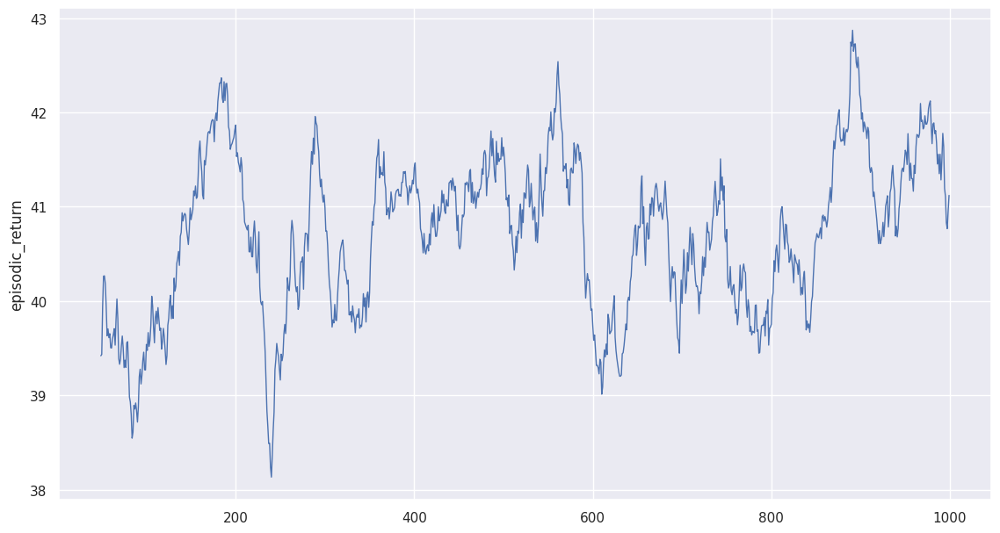

In [14]:
plot(return_dir)

In [15]:
pd.read_csv(return_dir).describe()

,episodic_return
count,1000.000000
mean,40.668097
std,6.235473
min,13.967036
25%,36.528421
50%,40.964781
75%,44.862683
max,59.306081


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


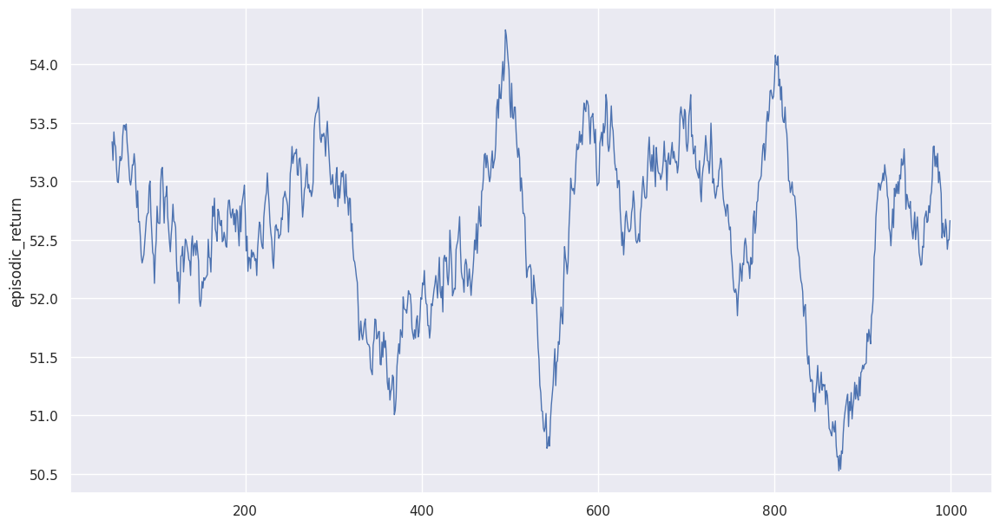

In [28]:
plot('v7_rx_14.csv')

In [29]:
pd.read_csv('v7_rx_14.csv').describe()

,episodic_return
count,1000.000000
mean,52.568577
std,5.043396
min,36.741022
25%,49.288344
50%,52.730119
75%,55.935640
max,68.677958


In [34]:
actions = pd.read_csv('v7_a_14.csv')
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    15984
1       16
Name: player 0, dtype: int64
0    13598
1     2402
Name: player 1, dtype: int64


In [17]:
16/16000

0.001

In [18]:
2402/16000

0.150125

## seed=6, max_cycles=16, num_episodes = 1000

In [2]:
args.num_episodes = 1000
args.seed = 6
args.max_cycles = 16
torch.manual_seed(args.seed)

In [3]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

agents:  ['player_0', 'player_1']
>>> episode : 0
{(0, 0): (3.4447991690160062, 3.4447991690160062), (0, 1): (0.19860876982215556, 5.470774565131542), (1, 0): (4.296922090020516, 0.1142062347492983), (1, 1): (0.9109675165153927, 0.9109675165153927)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (2.497725379985301, 2.497725379985301), (0, 1): (-0.18763668623058824, 4.953059152790822), (1, 0): (4.6819991731990855, 0.01663419990062094), (1, 1): (0.7890512202398061, 0.7890512202398061)}
Data Buffering Complete
>>> episode : 2
{(0, 0): (2.9128617126060963, 2.9128617126060963), (0, 1): (-0.09032638287219605, 4.866060308477657), (1, 0): (5.11676791146885, -0.29886988687405036), (1, 1): (0.7492880014694404, 0.7492880014694404)}
Data Buffering Complete
>>> episode : 3
{(0, 0): (2.307258473549056, 2.307258473549056), (0, 1): (-0.27658020842557, 4.704073064611717), (1, 0): (4.949747051156586, 0.17253186571779516), (1, 1): (1.1931017629277558, 1.1931017629277558)}
Data Buffering Complete
>>> ep

/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 8
{(0, 0): (3.0350118440133715, 3.0350118440133715), (0, 1): (-0.4679241159735158, 5.167411209108737), (1, 0): (4.6648280245986165, -0.14633353280523817), (1, 1): (1.014227224893362, 1.014227224893362)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 9
{(0, 0): (3.057888986170975, 3.057888986170975), (0, 1): (-0.13431799153557966, 5.148197872187741), (1, 0): (4.386577356944741, -0.36108700807360344), (1, 1): (1.1480401101552473, 1.1480401101552473)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 10
{(0, 0): (3.1375940551281225, 3.1375940551281225), (0, 1): (0.264741695871841, 5.064480211199455), (1, 0): (4.932473676360692, 0.36693632298375517), (1, 1): (0.811104733000515, 0.811104733000515)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 11
{(0, 0): (3.307041081020659, 3.307041081020659), (0, 1): (0.25953382710442713, 4.778039952590704), (1, 0): (4.793388889663372, -0.4891312815010628), (1, 1): (1

In [4]:
return_dir = 'v7_r_13.csv'
action_dir = 'v7_a_13.csv'
return_x_dir = 'v7_rx_13.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,0
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
15995,1,1
15996,1,1
15997,1,1
15998,1,1


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


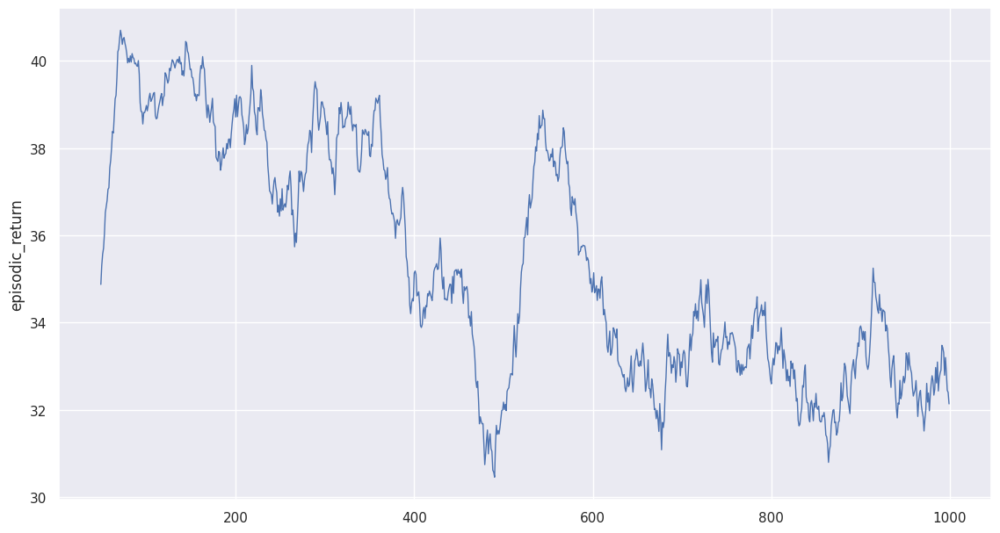

In [5]:
plot(return_dir)

In [6]:
pd.read_csv(return_dir).describe()

,episodic_return
count,1000.000000
mean,35.212004
std,10.222663
min,6.407114
25%,27.379980
50%,36.994830
75%,43.319495
max,60.158963


In [35]:
actions = pd.read_csv('v7_a_13.csv')
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    12104
1     3896
Name: player 0, dtype: int64
0    10303
1     5697
Name: player 1, dtype: int64


In [8]:
3896/16000

0.2435

In [10]:
5697/16000

0.3560625

## seed=5, max_cycles=16, num_episodes = 1000

In [2]:
args.num_episodes = 1000
args.seed = 5
args.max_cycles = 16
torch.manual_seed(args.seed)

In [3]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

agents:  ['player_0', 'player_1']
>>> episode : 0
{(0, 0): (2.8628189635625128, 2.8628189635625128), (0, 1): (0.07756767506860189, 5.167371171100794), (1, 0): (4.910956655222819, 0.1638098842581769), (1, 1): (0.650183760796005, 0.650183760796005)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (3.016455514921727, 3.016455514921727), (0, 1): (-0.22700796598658737, 4.678094502259072), (1, 0): (4.503215233022967, 0.30531698489987874), (1, 1): (0.9828242051578768, 0.9828242051578768)}
Data Buffering Complete
>>> episode : 2
{(0, 0): (2.770135959626407, 2.770135959626407), (0, 1): (0.03699492724831023, 5.0042005027276035), (1, 0): (4.80678847028054, 0.3396049605754931), (1, 1): (1.3215791718511598, 1.3215791718511598)}
Data Buffering Complete
>>> episode : 3
{(0, 0): (3.1286629568223647, 3.1286629568223647), (0, 1): (-0.03445197416840803, 5.135638774427868), (1, 0): (4.984453019450129, -0.5327909488362103), (1, 1): (0.9935661990996393, 0.9935661990996393)}
Data Buffering Complete
>>> epis

/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 8
{(0, 0): (3.385797243173595, 3.385797243173595), (0, 1): (-0.25386274648293367, 5.3880109861055425), (1, 0): (4.846568569813836, 0.4815674780249731), (1, 1): (0.8098827917722157, 0.8098827917722157)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 9
{(0, 0): (2.35651686465024, 2.35651686465024), (0, 1): (-0.15677155315840016, 5.526065333634255), (1, 0): (4.8461553379676605, -0.1770863936201624), (1, 1): (0.9960647135507688, 0.9960647135507688)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 10
{(0, 0): (3.1898644222942187, 3.1898644222942187), (0, 1): (-0.26085724970875, 4.910407203321418), (1, 0): (5.236904457012244, 0.5467623394799751), (1, 1): (1.2537283474977594, 1.2537283474977594)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 11
{(0, 0): (3.219674219510975, 3.219674219510975), (0, 1): (-0.01584558544736655, 4.744334698718197), (1, 0): (5.572187224754147, 0.34131675282793), (1, 1): (1.455

In [4]:
return_dir = 'v7_r_12.csv'
action_dir = 'v7_a_12.csv'
return_x_dir = 'v7_rx_12.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
15995,0,0
15996,0,0
15997,0,0
15998,0,0


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


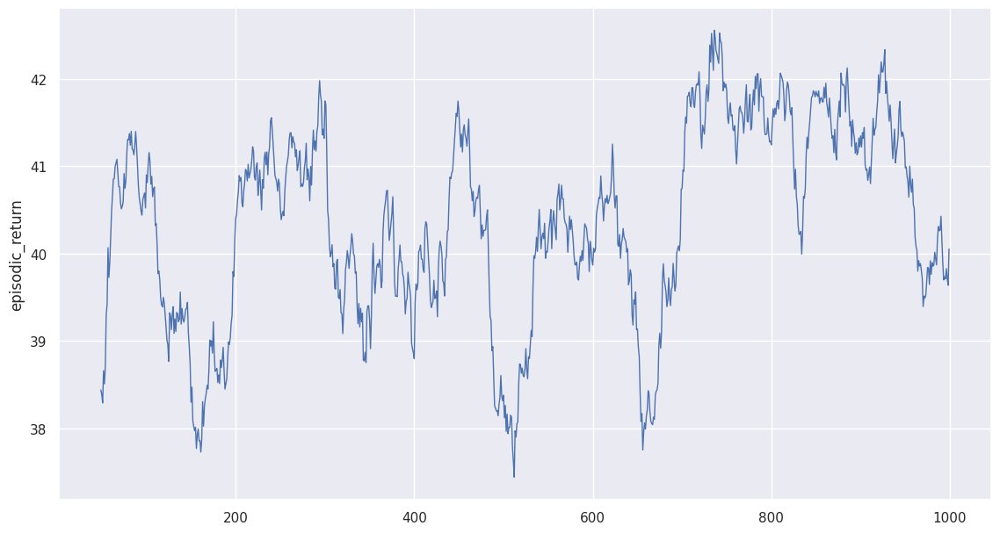

In [5]:
plot(return_dir)

In [6]:
pd.read_csv(return_dir).describe()

,episodic_return
count,1000.000000
mean,40.284156
std,7.016293
min,10.373807
25%,36.280862
50%,40.501951
75%,45.198477
max,58.448238


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


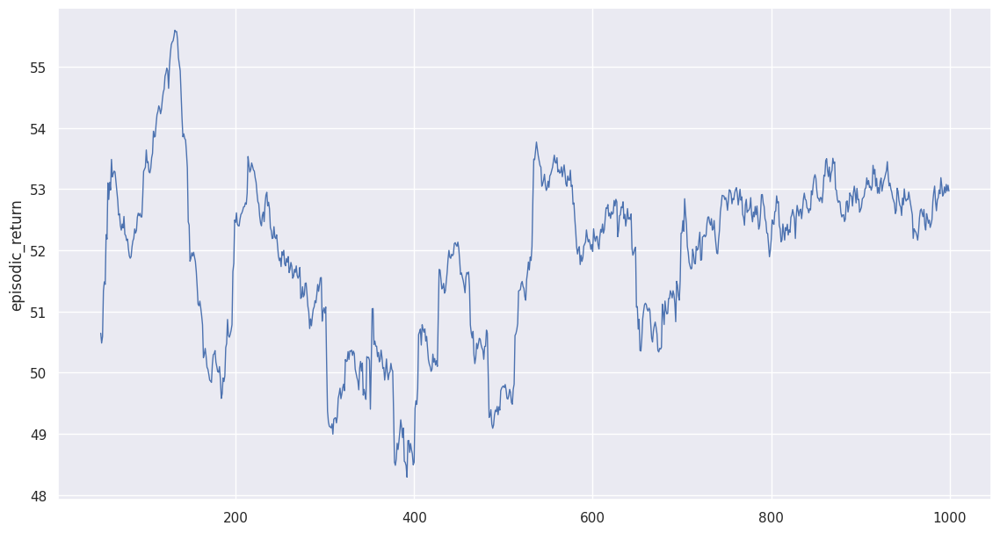

In [30]:
plot('v7_rx_12.csv')

In [31]:
pd.read_csv('v7_rx_12.csv').describe()

,episodic_return
count,1000.000000
mean,51.850228
std,7.459259
min,5.794640
25%,48.997763
50%,52.745621
75%,56.126540
max,70.412040


In [7]:
actions = pd.read_csv('v7_a_12.csv')
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    15625
1      375
Name: player 0, dtype: int64
0    13319
1     2681
Name: player 1, dtype: int64


In [8]:
375/16000

0.0234375

In [9]:
2681/16000

0.1675625

## seed=4, max_cycles=16, num_episodes = 2000

In [3]:
args.num_episodes = 2000
args.seed = 4
args.max_cycles = 16
torch.manual_seed(args.seed)

In [4]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

agents:  ['player_0', 'player_1']
>>> episode : 0
{(0, 0): (2.5438896161607647, 2.5438896161607647), (0, 1): (-0.07920238722265642, 5.193246757698575), (1, 0): (4.858809884669836, -0.2196133854181086), (1, 1): (1.0869121884766246, 1.0869121884766246)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (2.8958425937057486, 2.8958425937057486), (0, 1): (-0.23422108626180804, 5.2894514236210455), (1, 0): (5.244530134379305, 0.18044460976351653), (1, 1): (0.6428298551275381, 0.6428298551275381)}
Data Buffering Complete
>>> episode : 2
{(0, 0): (3.3462763274128555, 3.3462763274128555), (0, 1): (0.5521249105104911, 4.877795307778509), (1, 0): (4.9614146482719494, -0.10167803757197515), (1, 1): (0.8950216695113726, 0.8950216695113726)}
Data Buffering Complete
>>> episode : 3
{(0, 0): (2.8636488991542723, 2.8636488991542723), (0, 1): (0.3315526608267551, 5.090442511446394), (1, 0): (4.637701766007917, -0.155878086517201), (1, 1): (0.9413257110877625, 0.9413257110877625)}
Data Buffering Complete


/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 8
{(0, 0): (3.3173751000214065, 3.3173751000214065), (0, 1): (-0.21073407723748783, 5.152107344093011), (1, 0): (5.606130874022514, -0.19908191024962296), (1, 1): (0.8955786225238027, 0.8955786225238027)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 9
{(0, 0): (2.8228499335115953, 2.8228499335115953), (0, 1): (0.0881305650248944, 5.220396979769178), (1, 0): (5.135693248530932, -0.06881351899610258), (1, 1): (1.0764725352802238, 1.0764725352802238)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 10
{(0, 0): (3.11466865213136, 3.11466865213136), (0, 1): (0.4144287020542181, 5.3398603841432015), (1, 0): (5.3787552198009685, -0.27726739418191226), (1, 1): (0.6908011136621789, 0.6908011136621789)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 11
{(0, 0): (2.7895034730494825, 2.7895034730494825), (0, 1): (0.06285514303777204, 4.418097901296402), (1, 0): (5.087731797426004, 0.5586148433689587), (1, 1

In [5]:
args

Namespace(batch_size=128, num_episodes=2000, seed=4, max_cycles=16, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
return_dir = 'v7_r_11.csv'
action_dir = 'v7_a_11.csv'
return_x_dir = 'v7_rx_11.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,0
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
31995,0,0
31996,0,1
31997,0,0
31998,0,0


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


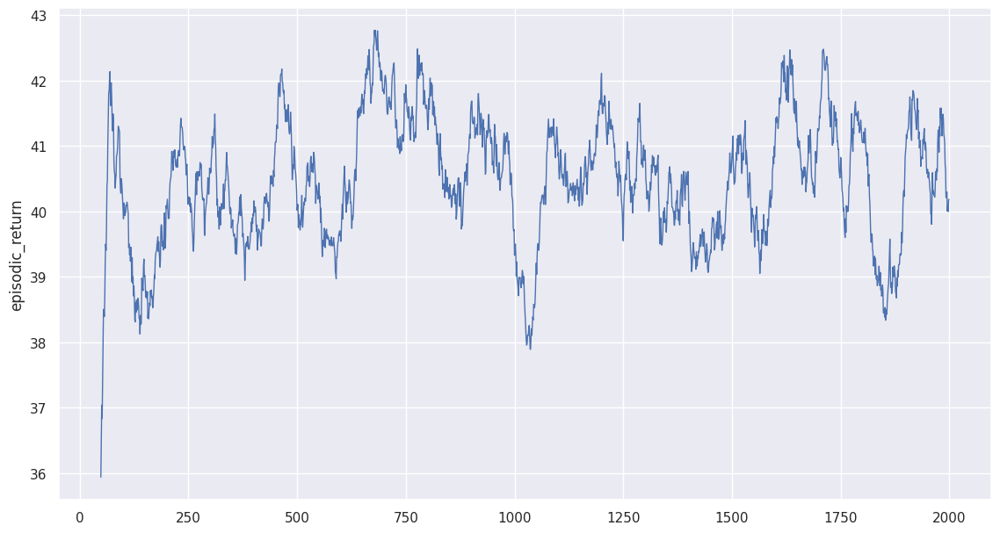

In [7]:
plot(return_dir)

In [8]:
pd.read_csv(return_dir).describe()

,episodic_return
count,2000.000000
mean,40.358242
std,6.336637
min,10.853727
25%,36.232057
50%,40.399307
75%,44.594067
max,60.492895


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


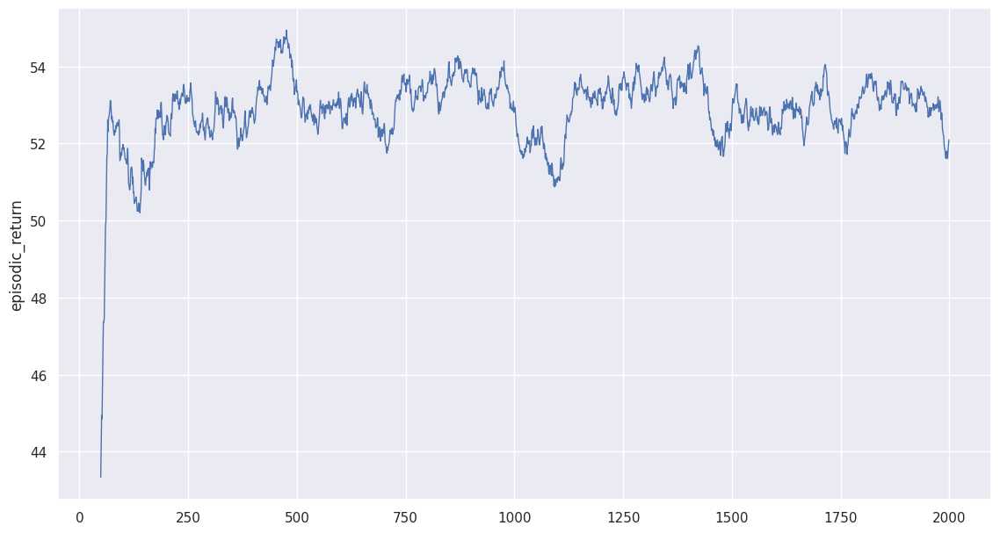

In [32]:
plot('v7_rx_11.csv')

In [33]:
pd.read_csv('v7_rx_11.csv').describe()

,episodic_return
count,2000.000000
mean,52.690138
std,5.933248
min,6.006971
25%,49.602214
50%,52.906180
75%,56.403798
max,68.713483


In [36]:
actions = pd.read_csv('v7_a_11.csv')
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    31734
1      266
Name: player 0, dtype: int64
0    26802
1     5198
Name: player 1, dtype: int64


## seed=4, max_cycles=16

In [2]:
args.num_episodes = 1000
args.seed = 4
args.max_cycles = 16
torch.manual_seed(args.seed)

In [3]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

agents:  ['player_0', 'player_1']
>>> episode : 0
{(0, 0): (3.2261601563275675, 3.2261601563275675), (0, 1): (0.009535760042286663, 5.371375559950317), (1, 0): (5.2534380397430995, -0.20766303172687842), (1, 1): (1.3078370083241793, 1.3078370083241793)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (2.8972397563195336, 2.8972397563195336), (0, 1): (0.12235845933357567, 4.708777064253399), (1, 0): (5.473330633393615, -0.24072706746736935), (1, 1): (1.1176285063933291, 1.1176285063933291)}
Data Buffering Complete
>>> episode : 2
{(0, 0): (3.259010365790849, 3.259010365790849), (0, 1): (-0.0718059666963331, 4.748460548729918), (1, 0): (5.282415485751227, 0.08943299733560665), (1, 1): (0.8593222462543719, 0.8593222462543719)}
Data Buffering Complete
>>> episode : 3
{(0, 0): (3.148543092772975, 3.148543092772975), (0, 1): (0.1874923796375151, 5.049309428655351), (1, 0): (4.736501260121578, -0.30277945413027846), (1, 1): (0.44702008794284354, 0.44702008794284354)}
Data Buffering Complete


/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 8
{(0, 0): (3.5750125608386742, 3.5750125608386742), (0, 1): (0.35578382984899853, 4.96727671182697), (1, 0): (4.75178908820833, 0.16442986676218732), (1, 1): (1.6225414044572835, 1.6225414044572835)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 9
{(0, 0): (2.7319622573034454, 2.7319622573034454), (0, 1): (-0.17697943120650123, 4.631128899887663), (1, 0): (4.885127685754128, 0.0906768416498443), (1, 1): (1.5218447475692751, 1.5218447475692751)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 10
{(0, 0): (3.027896832008613, 3.027896832008613), (0, 1): (0.32969763891016446, 4.936321737613392), (1, 0): (4.865508611594429, 0.04050770977626127), (1, 1): (1.4359698896187327, 1.4359698896187327)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 11
{(0, 0): (3.221500529052531, 3.221500529052531), (0, 1): (0.06847718631383713, 5.511915401656534), (1, 0): (5.678056510631377, 0.4422902377770071), (1, 1): (1.

In [4]:
args

Namespace(batch_size=128, num_episodes=1000, seed=4, max_cycles=16, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [5]:
return_dir = 'v7_r_10.csv'
action_dir = 'v7_a_10.csv'
return_x_dir = 'v7_rx_10.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,0
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
15995,0,0
15996,0,0
15997,0,0
15998,0,0


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


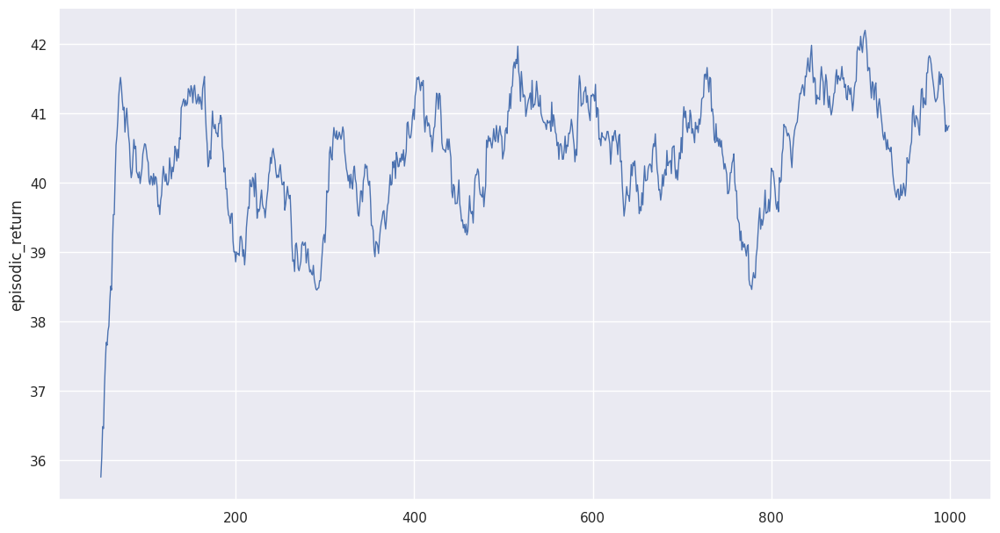

In [6]:
plot(return_dir)

In [7]:
pd.read_csv(return_dir).describe()

,episodic_return
count,1000.000000
mean,40.205761
std,6.491717
min,11.441803
25%,36.165419
50%,40.333072
75%,44.541681
max,59.941650


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


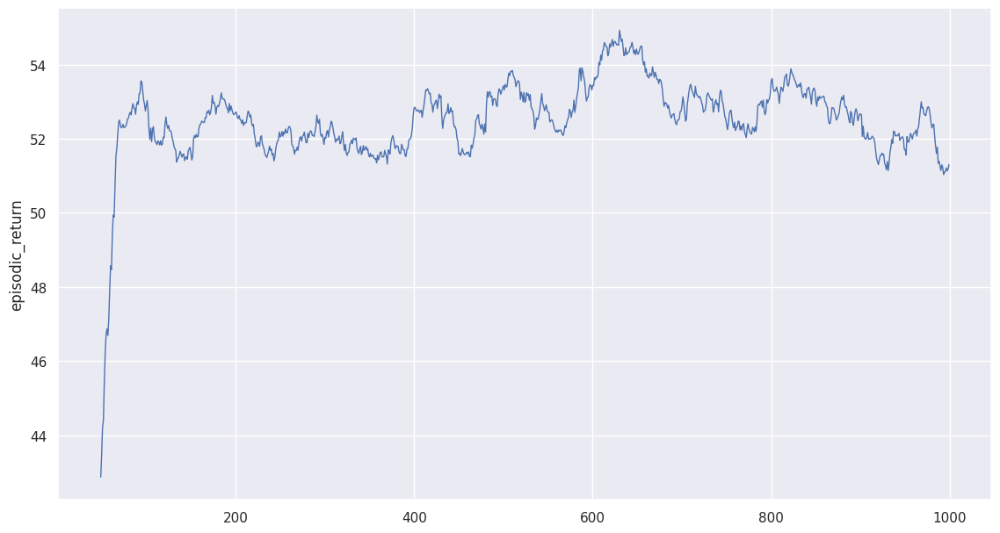

In [8]:
plot(return_x_dir)

In [9]:
pd.read_csv(return_x_dir).describe()

,episodic_return
count,1000.000000
mean,52.077653
std,6.645311
min,6.402522
25%,49.148891
50%,52.661302
75%,56.088018
max,68.380753


In [9]:
actions = pd.read_csv('v7_a_10.csv')
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    15752
1      248
Name: player 0, dtype: int64
0    13380
1     2620
Name: player 1, dtype: int64


In [12]:
248/16000

0.0155

In [13]:
2620/16000

0.16375

In [14]:
# Player 0 becomes so nice such that Player 1 (not intentionally) exploits Player 0

## seed=4, max_cycles=32

In [2]:
args.num_episodes = 1000
args.seed = 4
args.max_cycles = 32
torch.manual_seed(args.seed)

In [3]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

agents:  ['player_0', 'player_1']
>>> episode : 0
{(0, 0): (2.8993716288403406, 2.8993716288403406), (0, 1): (0.3550976224099293, 5.122698206863053), (1, 0): (5.162197284221251, -0.2585682743850444), (1, 1): (1.2518467541720095, 1.2518467541720095)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (2.589194687887115, 2.589194687887115), (0, 1): (0.05356659342923397, 4.777745479668452), (1, 0): (4.470968950334271, -0.006304331784918449), (1, 1): (1.4352930980065226, 1.4352930980065226)}
Data Buffering Complete
>>> episode : 2
{(0, 0): (2.6533858449792467, 2.6533858449792467), (0, 1): (-0.15372506895826535, 4.891615979935228), (1, 0): (5.442461323345192, 0.10181746463206334), (1, 1): (1.071098820790248, 1.071098820790248)}
Data Buffering Complete
>>> episode : 3
{(0, 0): (3.1302089982182335, 3.1302089982182335), (0, 1): (0.2065971628927856, 5.008823401535106), (1, 0): (5.039632978382756, -0.3260619478679738), (1, 1): (0.5161654992740168, 0.5161654992740168)}
Data Buffering Complete


/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 4
{(0, 0): (2.6883300641995995, 2.6883300641995995), (0, 1): (-0.48567751184149444, 5.2341179377947435), (1, 0): (5.140480730274466, 0.6562413735010736), (1, 1): (1.2664900422546068, 1.2664900422546068)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 5
{(0, 0): (2.9960478087958524, 2.9960478087958524), (0, 1): (0.03082443624518358, 4.903846551233918), (1, 0): (5.1123502451097735, 0.49498534367202557), (1, 1): (1.0430165450717463, 1.0430165450717463)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 6
{(0, 0): (3.3805817131989575, 3.3805817131989575), (0, 1): (-0.03285747029429083, 4.9611709151283545), (1, 0): (4.768842352117718, -0.3980992885856334), (1, 1): (0.870337028594262, 0.870337028594262)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 7
{(0, 0): (2.503875045518651, 2.503875045518651), (0, 1): (0.03317577964840591, 5.287239613878964), (1, 0): (4.9480351367411, 0.2348107677241307), (1, 1): (

In [4]:
args

Namespace(batch_size=128, num_episodes=1000, seed=4, max_cycles=32, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [5]:
return_dir = 'v7_r_9.csv'
action_dir = 'v7_a_9.csv'
return_x_dir = 'v7_rx_9.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,0
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
31995,0,0
31996,0,0
31997,0,0
31998,0,0


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


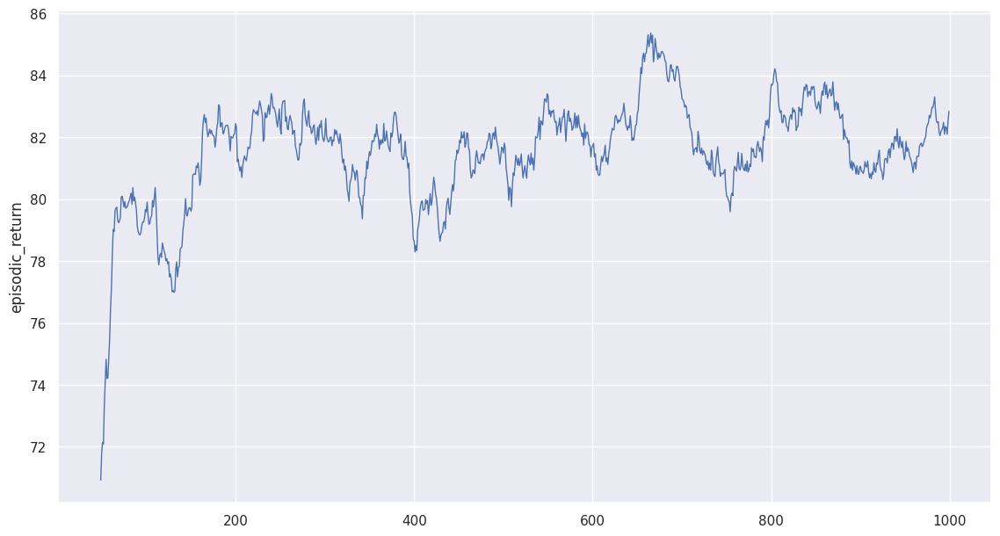

In [6]:
plot(return_dir)

In [7]:
returns = pd.read_csv('v7_r_9.csv')
returns.describe()

,episodic_return
count,1000.000000
mean,81.170913
std,11.209449
min,21.040763
25%,74.672963
50%,81.572029
75%,88.413616
max,113.853474


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


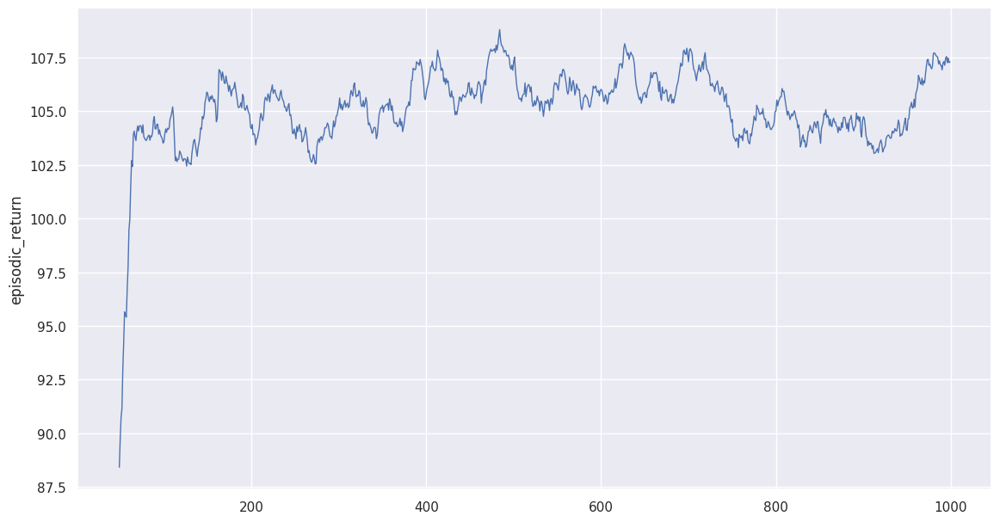

In [8]:
plot(return_x_dir)

In [9]:
returns = pd.read_csv('v7_rx_9.csv')
returns.describe()

,episodic_return
count,1000.000000
mean,104.525343
std,12.012785
min,15.675069
25%,98.934899
50%,105.193848
75%,111.862624
max,132.686476


In [37]:
actions = pd.read_csv('v7_a_9.csv')
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    31594
1      406
Name: player 0, dtype: int64
0    26922
1     5078
Name: player 1, dtype: int64


In [38]:
406/16000

0.025375

In [39]:
5078/16000

0.317375

## seed=4, max_cycles=64

In [2]:
args.num_episodes = 1000
args.seed = 4
args.max_cycles = 64
torch.manual_seed(args.seed)

In [3]:
Trainer = TRAINER(args = args, env = ipd('ansi').env)

agents:  ['player_0', 'player_1']


In [4]:
return_buffer, return_buffer_x, loss_buffer, action_buffer = Trainer.train()

>>> episode : 0
{(0, 0): (2.8208313147540465, 2.8208313147540465), (0, 1): (0.06312546421662692, 4.9732085368749654), (1, 0): (4.754604561769177, -0.0673437984065212), (1, 1): (1.0456497704922807, 1.0456497704922807)}
Data Buffering Complete
>>> episode : 1
{(0, 0): (3.339521808036369, 3.339521808036369), (0, 1): (-0.1646499668010385, 5.207254911306299), (1, 0): (5.311425488934449, -0.07157605469520964), (1, 1): (1.1978965258374334, 1.1978965258374334)}
Data Buffering Complete


/home/u00805/anaconda3/envs/ptz/lib/python3.9/site-packages/torch/nn/modules/loss.py:928: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete <batch>
>>> episode : 2
{(0, 0): (2.734344687262582, 2.734344687262582), (0, 1): (0.1827944543365501, 5.257505288416622), (1, 0): (4.932730633825317, -0.3972831479417407), (1, 1): (0.658839707977726, 0.658839707977726)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 3
{(0, 0): (2.960167937471365, 2.960167937471365), (0, 1): (0.23407564902530845, 4.833089535285213), (1, 0): (5.246518582672727, 0.11828385931823804), (1, 1): (1.1918099585965236, 1.1918099585965236)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 4
{(0, 0): (3.2170422283274283, 3.2170422283274283), (0, 1): (0.5150041421430979, 4.810850239340192), (1, 0): (4.806419791246001, -0.42996412939857626), (1, 1): (0.7579503257690814, 0.7579503257690814)}
Data Buffering Complete
Training Complete <batch>
>>> episode : 5
{(0, 0): (2.883081467057276, 2.883081467057276), (0, 1): (-0.08343350653106009, 4.839741864425103), (1, 0): (5.604403329923239, 0.32495791661402484), (1, 1): (0.758

In [6]:
args

Namespace(batch_size=128, num_episodes=1000, seed=4, max_cycles=64, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [7]:
return_dir = 'v7_r_8.csv'
action_dir = 'v7_a_8.csv'
return_x_dir = 'v7_rx_8.csv'
save_buffer(return_buffer,return_dir)
save_buffer(return_buffer_x,return_x_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,0
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
63995,0,1
63996,0,0
63997,0,0
63998,0,0


/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


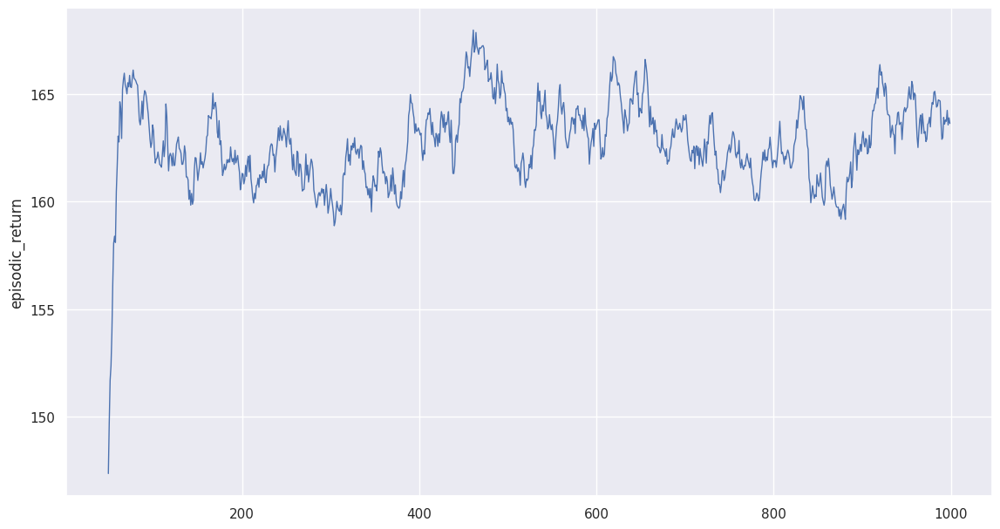

In [8]:
plot(return_dir)

/home/u00805/RL/BootDQN-SSD/IPD_utils.py:70: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=data, palette=sns.color_palette("magma", as_cmap=True), linewidth=1.0)


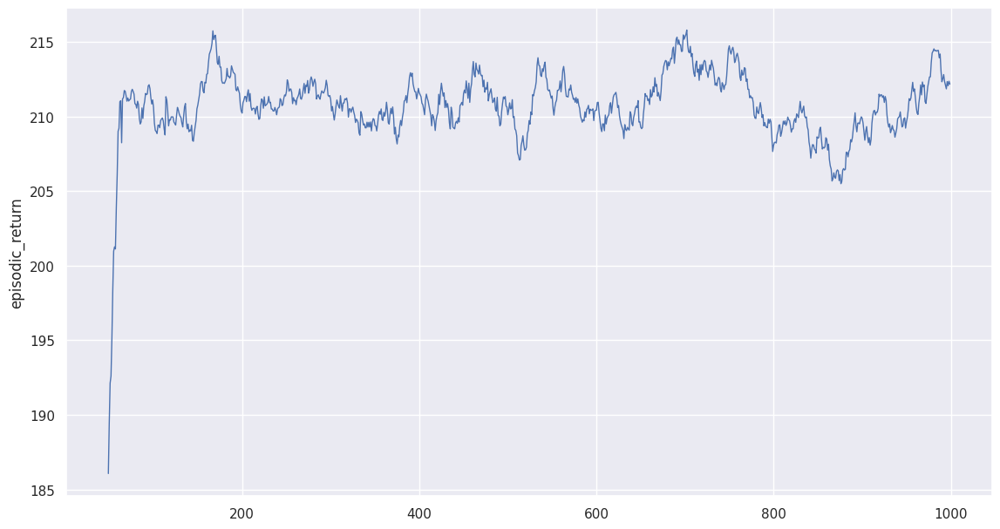

In [9]:
plot(return_x_dir)

In [10]:
returns = pd.read_csv('v7_r_8.csv')
returns.describe()

,episodic_return
count,1000.000000
mean,162.024342
std,20.800738
min,52.557290
25%,150.298202
50%,162.916264
75%,174.881072
max,215.092524


In [11]:
returns = pd.read_csv('v7_rx_8.csv')
returns.describe()

,episodic_return
count,1000.000000
mean,209.636210
std,22.530854
min,47.320906
25%,200.112248
50%,210.882404
75%,222.309839
max,269.676761


In [8]:
args

Namespace(batch_size=128, num_episodes=1000, seed=4, max_cycles=64, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [9]:
return_dir = 'v7_r_8.csv'
action_dir = 'v7_a_8.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
63995,0,0
63996,0,0
63997,0,0
63998,0,0


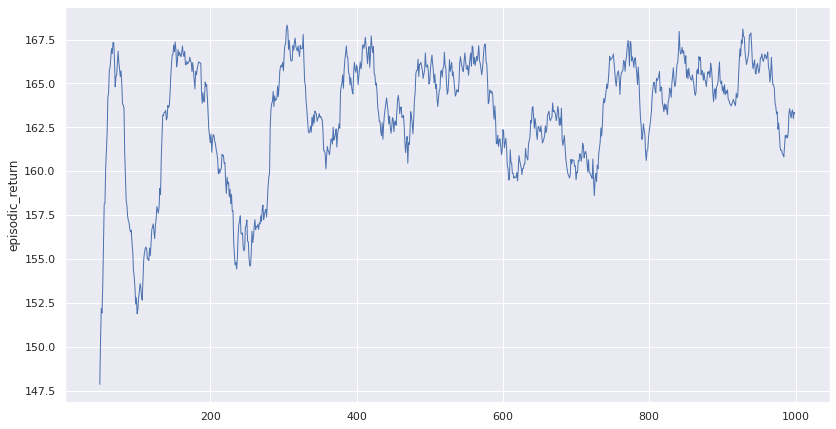

In [11]:
plot(return_dir)

In [12]:
returns = pd.read_csv(return_dir)
returns.describe()

,episodic_return
count,1000.000000
mean,162.423377
std,22.182957
min,49.074930
25%,150.638300
50%,162.331342
75%,176.498458
max,222.319806


In [9]:
args

Namespace(batch_size=128, num_episodes=1000, seed=4, max_cycles=16, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
return_dir = 'v7_r_8.csv'
action_dir = 'v7_a_8.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,0
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
15995,0,0
15996,0,0
15997,0,0
15998,0,0


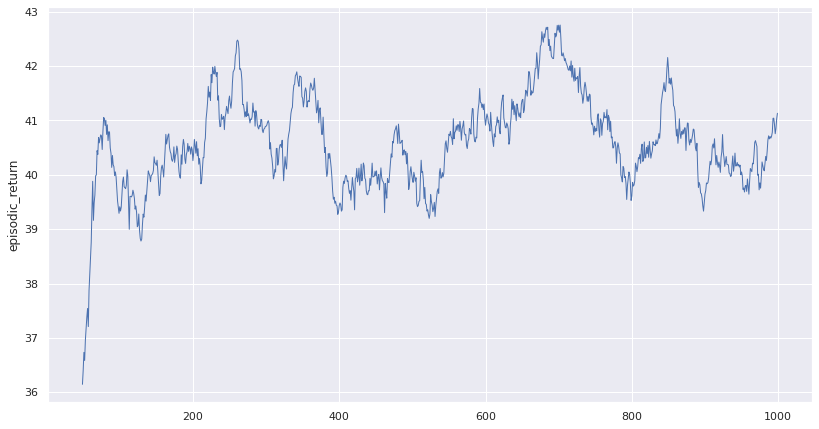

In [8]:
plot(return_dir)

In [10]:
returns = pd.read_csv(return_dir)
returns.describe()

,episodic_return
count,1000.000000
mean,40.399779
std,6.427481
min,14.230952
25%,36.580753
50%,40.572604
75%,44.631807
max,61.055439


In [10]:
args

Namespace(batch_size=128, num_episodes=1000, seed=3, max_cycles=16, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
return_dir = 'v7_r_8.csv'
action_dir = 'v7_a_8.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,1
1,0,1
2,0,1
3,0,1
4,0,0
...,...,...
15995,0,0
15996,0,0
15997,0,1
15998,0,0


In [8]:
sns.set(rc={'figure.figsize':(13.7,7.27)})


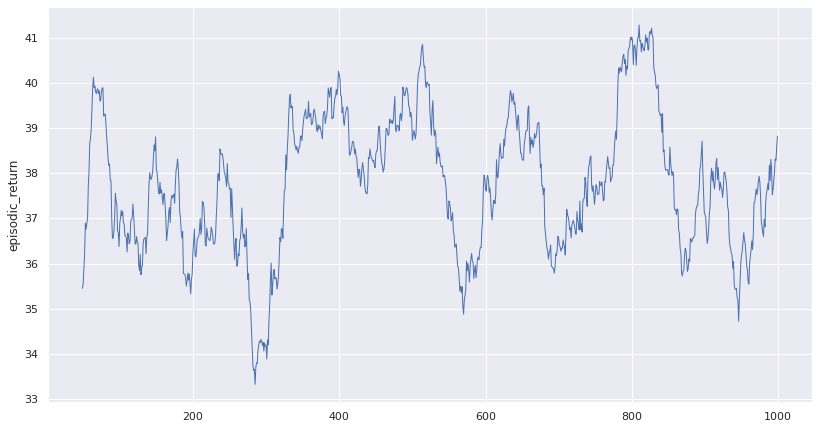

In [8]:
plot(return_dir, rolling=50)

In [9]:
returns = pd.read_csv(return_dir)
returns.describe()

,episodic_return
count,1000.000000
mean,37.644147
std,9.375821
min,4.105288
25%,33.417740
50%,39.314158
75%,43.867569
max,61.391343


Namespace(batch_size=128, num_episodes=1000, seed=1339, max_cycles=16, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [11]:
return_buffer, loss_buffer, action_buffer = Trainer.train()

>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
Training Complete on this episode
>>> episode : 2
Data Buffering Complete
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
Training Complete on this episode
>>> episode : 5
Data Buffering Complete
Training Complete on this episode
>>> episode : 6
Data Buffering Complete
Training Complete on this episode
>>> episode : 7
Data Buffering Complete
Training Complete on this episode
>>> episode : 8
Data Buffering Complete


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Training Complete on this episode
>>> episode : 9
Data Buffering Complete
Training Complete on this episode
>>> episode : 10
Data Buffering Complete
Training Complete on this episode
>>> episode : 11
Data Buffering Complete
Training Complete on this episode
>>> episode : 12
Data Buffering Complete
Training Complete on this episode
>>> episode : 13
Data Buffering Complete
Training Complete on this episode
>>> episode : 14
Data Buffering Complete
Training Complete on this episode
>>> episode : 15
Data Buffering Complete
Training Complete on this episode
>>> episode : 16
Data Buffering Complete
Training Complete on this episode
>>> episode : 17
Data Buffering Complete
Training Complete on this episode
>>> episode : 18
Data Buffering Complete
Training Complete on this episode
>>> episode : 19
Data Buffering Complete
Training Complete on this episode
>>> episode : 20
Data Buffering Complete
Training Complete on this episode
>>> episode : 21
Data Buffering Complete
Training Complete on this 

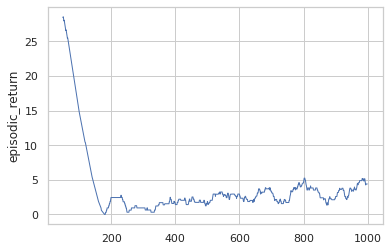

In [8]:
return_dir = 'v7_r_8.csv'
action_dir = 'v7_a_8.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

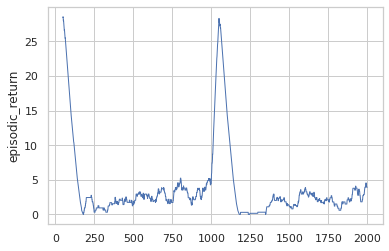

In [10]:
return_dir = 'v7_r_9.csv'
action_dir = 'v7_a_9.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

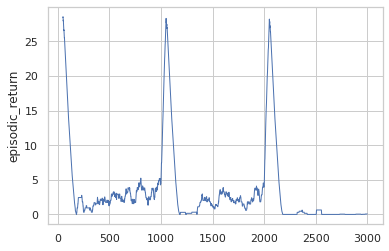

In [12]:
return_dir = 'v7_r_10.csv'
action_dir = 'v7_a_10.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

Namespace(batch_size=128, num_episodes=2000, seed=1, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [5]:
return_buffer, loss_buffer, action_buffer = Trainer.train()

>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.1823, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.1910, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.1957, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.1871, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.1932, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2167, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2121, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.1727, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.2058, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2023, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2076, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.1799, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.1967, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2003, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2025, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

In [6]:
return_dir = 'v7_r_1.csv'
action_dir = 'v7_a_1.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,1,1
1,0,1
2,1,1
3,0,1
4,1,1
...,...,...
191995,0,0
191996,0,0
191997,0,0
191998,0,0


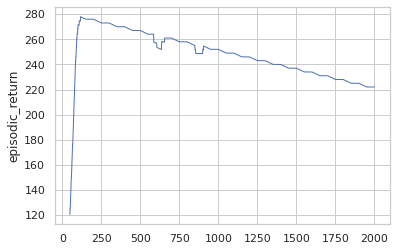

In [7]:
plot_buffer(return_dir)

In [8]:
actions = pd.read_csv(action_dir)
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    187158
1      4842
Name: player 0, dtype: int64
0    162289
1     29711
Name: player 1, dtype: int64


Namespace(batch_size=128, num_episodes=2000, seed=1, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [5]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 10:38:07.834541
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(1.1328, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.2305, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.3067, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1753, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(1.2500, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1292, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1037, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.0803, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(1.2695, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.2068, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.2391, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.0981, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(1.2304, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1479, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.2376, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

In [6]:
return_dir = 'v7_r_2.csv'
action_dir = 'v7_a_2.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)

,player 0,player 1
0,0,1
1,0,1
2,0,1
3,0,0
4,0,0
...,...,...
191995,0,0
191996,0,0
191997,0,0
191998,0,0


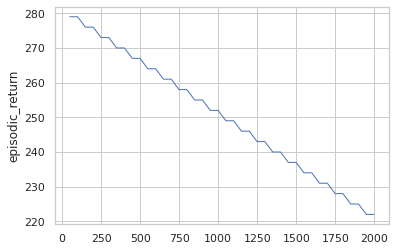

In [7]:
plot_buffer(return_dir)

In [8]:
actions = pd.read_csv(action_dir)
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    192000
Name: player 0, dtype: int64
0    167000
1     25000
Name: player 1, dtype: int64


Namespace(batch_size=128, num_episodes=2000, seed=1, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 10:57:23.090709
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.8634, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7318, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7725, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.8201, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.6229, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5953, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5799, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4679, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.8728, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7084, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.8736, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6774, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.7780, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5821, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5732, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

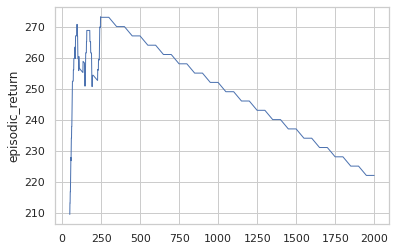

In [7]:
return_dir = 'v7_r_2.csv'
action_dir = 'v7_a_2.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

In [8]:
actions = pd.read_csv(action_dir)
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    188796
1      3204
Name: player 0, dtype: int64
0    163850
1     28150
Name: player 1, dtype: int64


Namespace(batch_size=128, num_episodes=2000, seed=250, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 11:22:17.288283
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.4118, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2157, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4455, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2781, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.3477, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2530, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4083, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2249, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.2734, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2351, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3620, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2426, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.3140, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4510, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4668, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

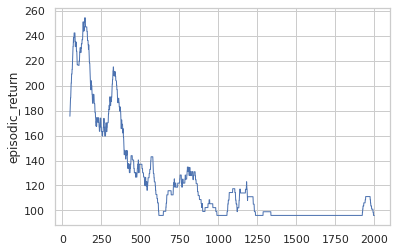

In [7]:
return_dir = 'v7_r_3.csv'
action_dir = 'v7_a_3.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

Namespace(batch_size=128, num_episodes=2000, seed=600, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 12:28:35.313172
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.9068, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7997, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6075, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.9384, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.7170, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7239, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6139, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5978, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.8012, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.8571, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6425, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.9053, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.8871, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7454, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6198, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

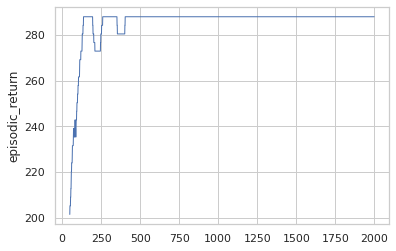

In [7]:
return_dir = 'v7_r_4.csv'
action_dir = 'v7_a_4.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

In [8]:
actions = pd.read_csv(action_dir)
print(actions['player 0'].value_counts())
print(actions['player 1'].value_counts())

0    188353
1      3647
Name: player 0, dtype: int64
0    188390
1      3610
Name: player 1, dtype: int64


Namespace(batch_size=128, num_episodes=2000, seed=999, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 12:41:27.865026
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(1.2500, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1708, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.4418, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1635, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(1.2695, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.0312, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.4515, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.3006, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(1.1132, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1678, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.4123, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.2775, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(1.1913, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.1091, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.2381, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

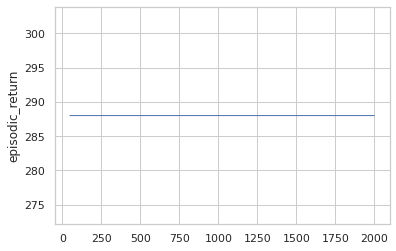

In [7]:
return_dir = 'v7_r_5.csv'
action_dir = 'v7_a_5.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

Namespace(batch_size=128, num_episodes=2000, seed=888, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 12:59:50.456731
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.2187, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3713, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3141, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3133, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.2460, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3168, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3009, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3249, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.4474, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5132, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4630, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5410, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.3485, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3524, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3902, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

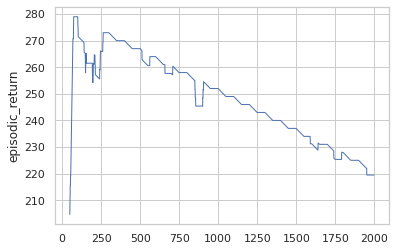

In [7]:
return_dir = 'v7_r_6.csv'
action_dir = 'v7_a_6.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

Namespace(batch_size=128, num_episodes=2000, seed=9999, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 13:57:05.733937
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.8515, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.9245, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(1.0349, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7841, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.8046, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6924, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6975, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5132, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.8241, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.8205, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.9307, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6726, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.6992, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6415, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6646, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

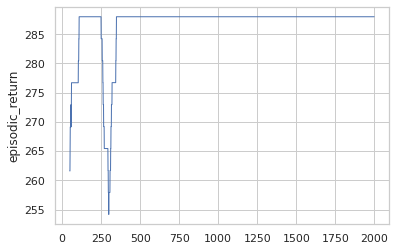

In [7]:
return_dir = 'v7_r_6.csv'
action_dir = 'v7_a_6.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

Namespace(batch_size=128, num_episodes=2000, seed=1234, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 14:21:42.184578
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.2305, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2281, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2956, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5054, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.2964, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2892, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.2762, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4000, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.4451, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4878, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6125, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5897, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.3729, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.3894, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4406, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

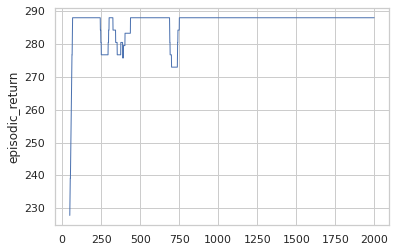

In [7]:
return_dir = 'v7_r_6.csv'
action_dir = 'v7_a_6.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

Namespace(batch_size=128, num_episodes=2000, seed=1339, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 14:36:04.255313
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
criterion tensor(0.7236, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7550, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6475, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7591, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
criterion tensor(0.6408, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6006, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.4796, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6197, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
criterion tensor(0.9214, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.7581, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.8522, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6978, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
criterion tensor(0.5768, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.6905, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
criterion tensor(0.5957, device='cuda:0', grad_fn=<SmoothL1LossBackward0>)
cri

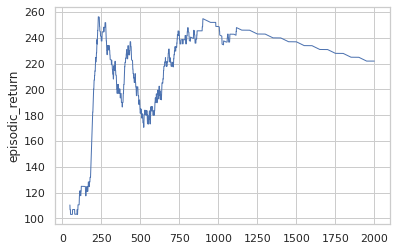

In [7]:
return_dir = 'v7_r_6.csv'
action_dir = 'v7_a_6.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)

CHANGELog

(1) if i_episode%100 == 0 and i_episode>3:
                
   OBS_LIM += 1
                
(2) y = np.random.choice([0,1],1, p=[0.85, 0.15])[0] # cooperate

Namespace(batch_size=128, num_episodes=2000, seed=1339, max_cycles=96, obs_lim=3, memory_size=98304, learning_rate=0.001, target_update=10, num_heads=4, bernoulli=0.5)

In [6]:
print(datetime.datetime.now())
return_buffer, loss_buffer, action_buffer = Trainer.train()

2022-12-17 15:29:41.443211
>>> episode : 0
Data Buffering Complete
Training Complete on this episode
>>> episode : 1
Data Buffering Complete
Training Complete on this episode
>>> episode : 2


/usr/local/lib/python3.9/dist-packages/torch/nn/modules/loss.py:922: UserWarning: Using a target size (torch.Size([128, 1, 1])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.smooth_l1_loss(input, target, reduction=self.reduction, beta=self.beta)


Data Buffering Complete
Training Complete on this episode
>>> episode : 3
Data Buffering Complete
Training Complete on this episode
>>> episode : 4
Data Buffering Complete
Training Complete on this episode
>>> episode : 5
Data Buffering Complete
Training Complete on this episode
>>> episode : 6
Data Buffering Complete
Training Complete on this episode
>>> episode : 7
Data Buffering Complete
Training Complete on this episode
>>> episode : 8
Data Buffering Complete
Training Complete on this episode
>>> episode : 9
Data Buffering Complete
Training Complete on this episode
>>> episode : 10
Data Buffering Complete
Training Complete on this episode
>>> episode : 11
Data Buffering Complete
Training Complete on this episode
>>> episode : 12
Data Buffering Complete
Training Complete on this episode
>>> episode : 13
Data Buffering Complete
Training Complete on this episode
>>> episode : 14
Data Buffering Complete
Training Complete on this episode
>>> episode : 15
Data Buffering Complete
Training

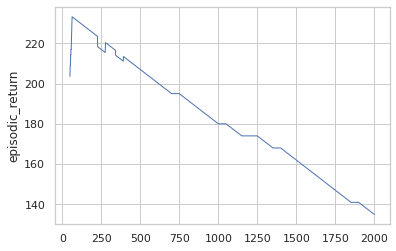

In [7]:
return_dir = 'v7_r_7.csv'
action_dir = 'v7_a_7.csv'
save_buffer(return_buffer,return_dir)
save_action(action_buffer,action_dir)
plot_buffer(return_dir)